# DSMCER Lecture 3: Hypothesis testing and bootstrapping

1. Hypothesis testing
    1. Confidence interval codified
    2. _Poll_: Let's play "can we CI it?!"
    3. _Exercise_: Test of hypothesis on the mean
    4. Single and double T tests
2. Parametrics vs Non-parametric tests
    1. Tests using other defined distributions
    2. _Exercise_: Distribution of minima
    3. Boostrapping
3. Distribution Divergence

In [1]:
import scipy.stats

import matplotlib.pyplot as plt
from matplotlib import cm
import seaborn as sns
import pandas as pd
import numpy as np

sns.set_style('whitegrid')
sns.set_context('talk')

***
***

# 1. Hypothesis testing

<font size=5><center>__Recall__:

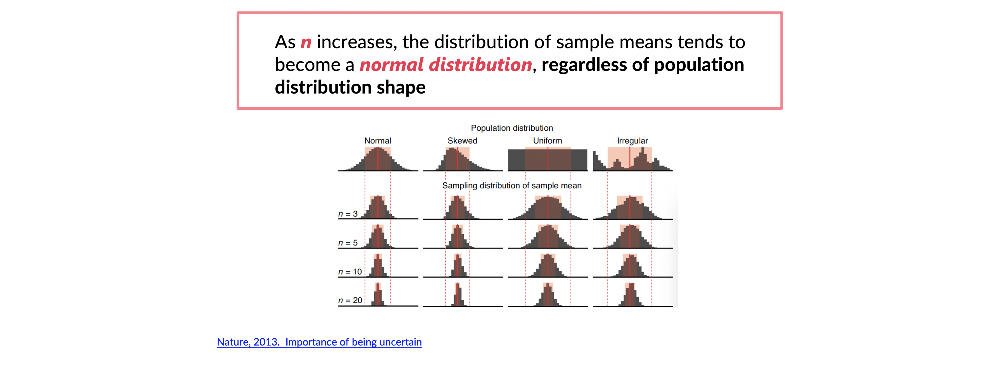<font size=4><center>

<font size=4><center>We used this fact to __build a confidence interval on the true population mean__, and made a slight modification using the T distribution to account for non-normality at small sample sizes.

***

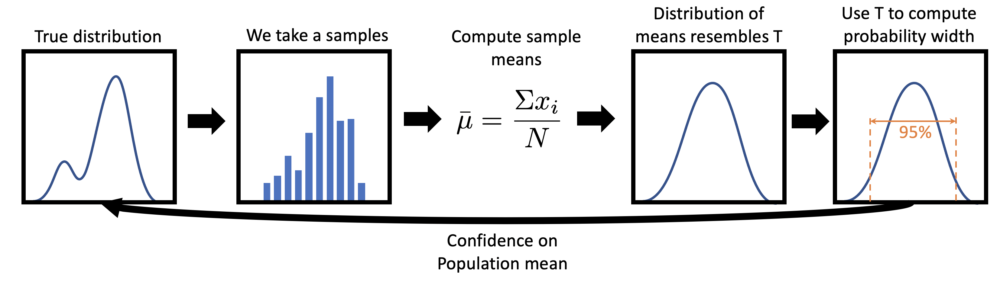

<font size=5><center>__This principle is good for more than just estimating the population mean!__ I propose that we can invert the problem, and <span style='color:green'>__check if a sample mean comes from a known population__</span>, or even that two samples came from the same unknown one!

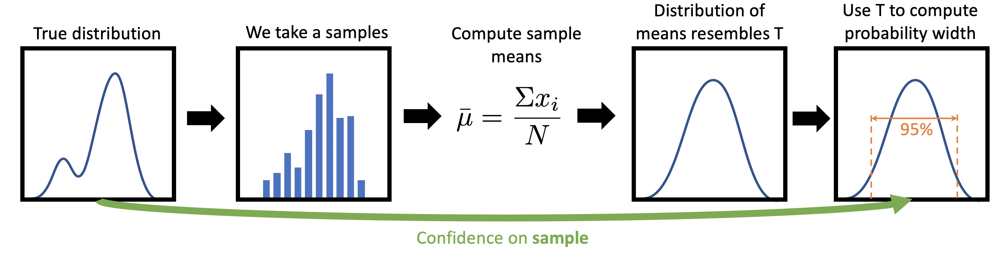

<font size=5><center>We can also apply this principle to <span style='color:purple'>__statistics other than the mean__.

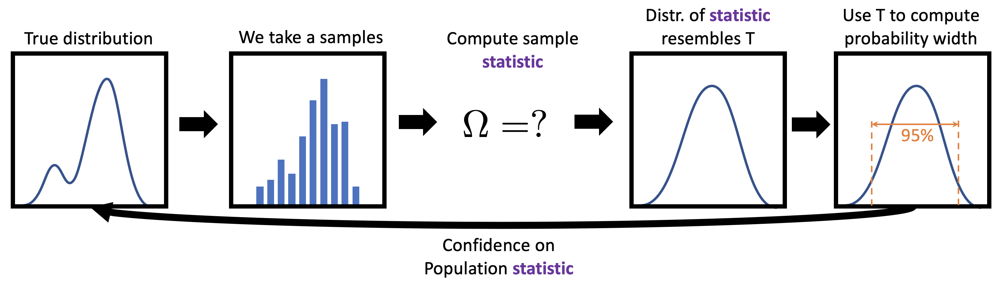

<font size=5><center>Or even <span style='color:orange'>__test out sample statistics that do not follow the T distribution!__

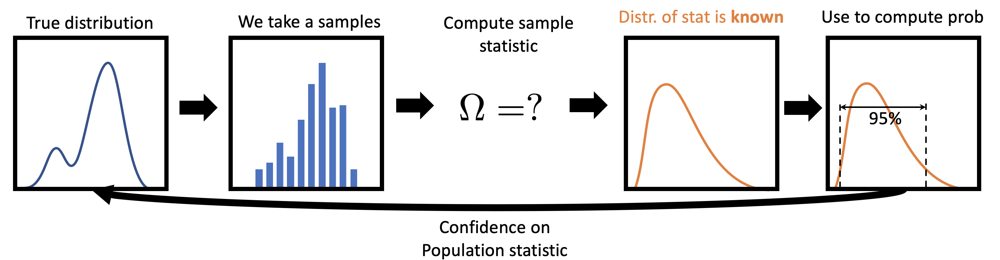

### A. Confidence interval codified (WARNING: small amount of dense math)

<font size=4><center>We built a confidence interval on the population mean using three things: the sample mean, the sample standard error, and the desired confidence level. This can be generalized for any statistic:
    
$$\bar{\Omega}_{sample} - g_{\alpha}<\Omega< \bar{\Omega}_{sample} + g_{\alpha}$$

<font size=4><center>Eg. __The population statistic $\Omega$ is within the the average of the statistic over samples $\bar{\Omega}_{sample}$ and a probability width $g_\alpha$__

<font size=4><center>_$g_\alpha$ is entirely dependant on the distribution that the statistic takes over samples, and the level of confidence $\alpha$ that you require._

<font size=4>__Let's walk back through the simplificaition of this for estimatating population mean__. For our statistic being the mean $\mu$ this becomes

$$\bar{\mu}_{sample} - g_{\alpha}<\mu< \bar{\mu}_{sample} + g_{\alpha}$$

<font size=4>From the central limit theorem we get that the sample mean $\mu_{sample}$ will tend to the mean of means $\bar{\mu}_{sample}$:

$$\mu_{sample} - g_{\alpha}<\mu< \mu_{sample} + g_{\alpha}$$

<font size=4>Also from CLT: the mean of means resembles the normal distribution, with width equal to the standard error. We can exactly compute the probability around the center of the normal distribution for desired confidence $\alpha$ eg 95%. Also apply the fact that the Gaussian distribution is symmetric:

$$\mu\in \mu_{sample} \pm G({\alpha})\frac{\sigma}{\sqrt{n}}$$

<font size=4>Where $G(\alpha)$ is the number of standard errors required to get $\alpha$ confidence according to the Gaussian distribution.

<font size=4>Because we use the sample standard deviation $\sigma_{sample}$ instead of the population standard deviation $\sigma$ (which we do not have), we have to use the T distribution instead of the Normal distribution:

$$\mu\in \mu_{sample} \pm t({\alpha})\frac{\sigma_{sample}}{\sqrt{n}}$$

<font size=5><center>__MATH OVER!__

<font size=4>Let's have a __look at the T distribution vs the normal distribution__ for $\mu=0$ and $\sigma=1$

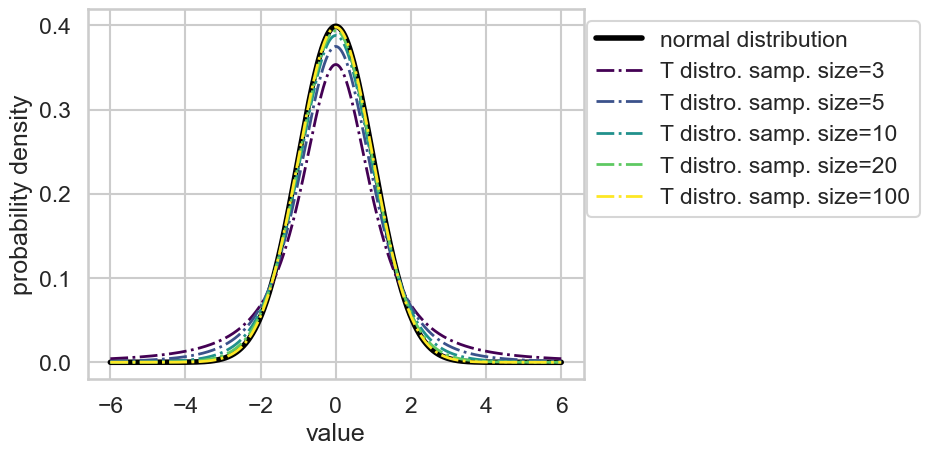

In [2]:
x = np.linspace(-6, 6, 1000)
norm = scipy.stats.norm.pdf(x)

#prepare sample sizes to test and associated colors and dashes
sample_sizes = [3, 5, 10, 20, 100]
blues = cm.get_cmap("viridis", len(sample_sizes))

# plot normal distro
fig, ax = plt.subplots()
ax.plot(x, norm, label="normal distribution", c='black', lw=4)
ax.set_xlabel('value')
ax.set_ylabel('probability density')

for i, sample_size in enumerate(sample_sizes):
    ax.plot(
        x,
        scipy.stats.t.pdf(x, df=sample_size-1),
        label=f"T distro. samp. size={sample_size}",
        color=blues(i),
        ls='-.',
        lw=2
    )
ax.legend(loc="upper right", bbox_to_anchor=(1.7, 1.0))

<font size=4>The shape of the T is a function of the sample size, formally "degrees of freedom" which is the sample size minus 1. __For large samples, the T test is just using the statistic calculated from the normal distribution__.

### B. _Poll_: Let's play "can we CI it?!"

<font size=4>Keep in mind the observations/assumptions that we made to arrive at the the T confidence interval of the population mean!
    
<font size=5><center>Consider the following distribution.

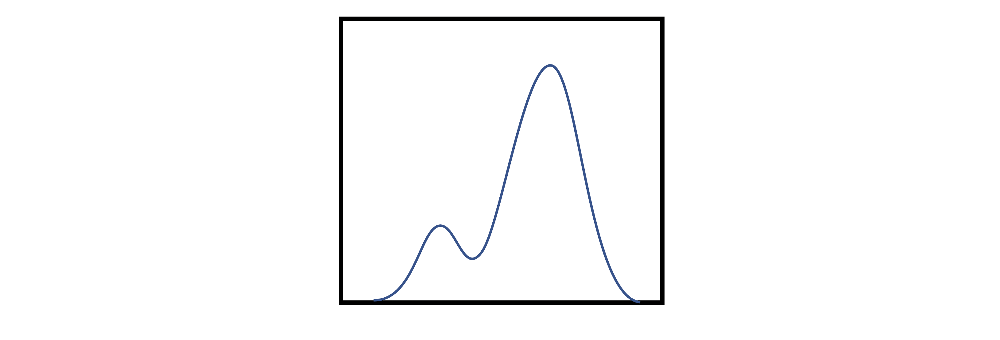

    
<font size=4>1) If this were an __empirical distribution of data__ from a sample, could we use it to __estimate the population mean using the T distribution__?
    
<font size=4>2) If this were a __distribution of some statistic from many samples__, could we use it to __estimate the population statistic using the T distribution__?

### C. _Exercise_: Test of hypothesis on the mean

<font size=4>Consider the HCEPDB data, and the column "jsc". Assume that the mean of the entire dataset is the population mean (last lecture should have convinced you that it is at least very close!) 

<font size=4>1. Sample 500 materials __randomly__ and compute the confidence interval on the population mean. Does it fall within the bounds?
    
<font size=4>2. Sample 500 materials __with the smallest mass__ and compute the confidence interval on the population mean. Does it fall within the bounds?

In [3]:
df = pd.read_csv('http://faculty.washington.edu/dacb/HCEPDB_moldata.zip')

In [4]:
popmean=df['jsc'].mean()

In [5]:
print(f"Population mean: {popmean}")

Population mean: 120.46948830191943


In [6]:
random_sample = df['jsc'].sample(n=500)

In [7]:
small_mass_sample = df.sort_values(by='mass').iloc[:500]['jsc']

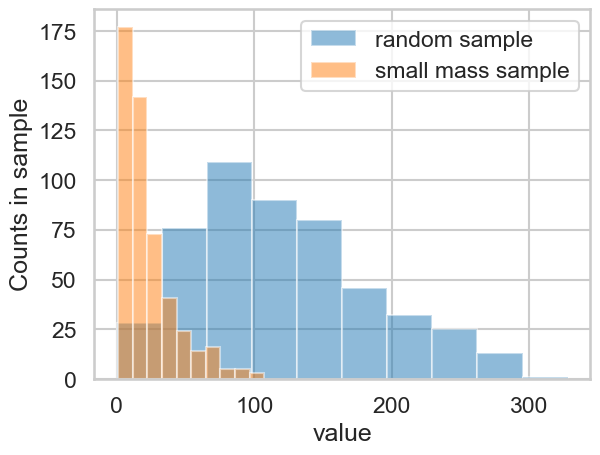

In [8]:
fig, ax = plt.subplots()
x = np.linspace(-3, 3, num=100)
ax.hist(x=random_sample, label='random sample', alpha=.5)
ax.hist(x=small_mass_sample, label='small mass sample', alpha=.5)
ax.set_xlabel('value')
ax.set_ylabel('Counts in sample')
plt.legend()

<font size=4>These are clearly different, but the exercise can help us make a judgement with statistical confidence.

> <span style='color:red'>remove before lecture

In [9]:
scipy.stats.t.interval(alpha=.95, df=499, loc=random_sample.mean(), scale=random_sample.sem())

(115.16583916742339, 126.54971436157483)

In [10]:
scipy.stats.t.interval(alpha=.95, df=499, loc=small_mass_sample.mean(), scale=small_mass_sample.sem())

(21.206851231817424, 24.629815667185767)

### D. Single and double T test

<font size=3>What we did above was test (up to 95% confidence) __whether the sample was drawn from the known distribution randomly__. It confirmed that the one chosen randomly was indeed, while the one NOT chosen randomly (it was chosen based on the mass of the material) failed the test.
    
<font size=3>This was what we call a __hypothesis test__ with the question: __is the sample drawn from a population with mean different from X?__ 
    
<font size=4><center>This can be done directly with a bit more structure than computing a CI and comparing that to the population mean: 

In [11]:
scipy.stats.ttest_1samp(small_mass_sample, popmean=popmean, alternative='two-sided')

Ttest_1sampResult(statistic=-111.98575076209326, pvalue=0.0)

<font size=3>This gives us a number to work with: __`pvalue` indicates significance of the result__. Since it is less than 0.01, we can say that we are 99% confident that the sample did not come randomly from the known population.
    
<font size=3>The `alternative='two_sided'` comes from the fact that we wanted to ask if the sample mean is either significantly __less__ or __more__. We can choose a different alternative.

In [12]:
scipy.stats.ttest_1samp(small_mass_sample, popmean=popmean, alternative='less')

Ttest_1sampResult(statistic=-111.98575076209326, pvalue=0.0)

<font size=3>This effects the stats as follows:

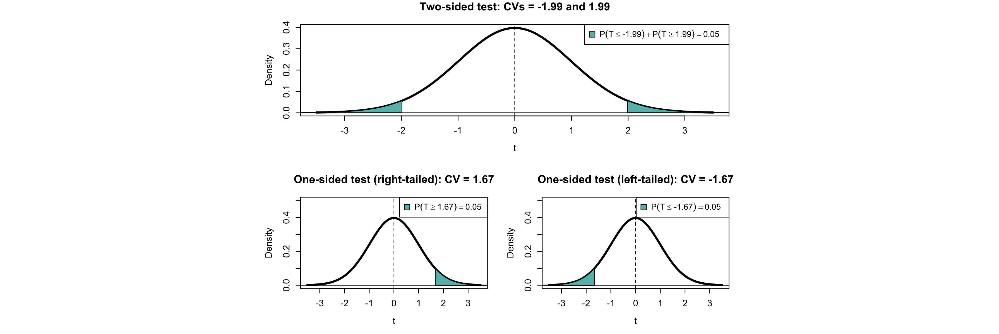

https://bookdown.org/content/50a3178d-5432-44a3-bb5c-1718ca3e1fe2/3.2-one-sided-vs-two-sided-tests.html

<font size=5><center>What if instead of wanting to know if a population produced a sample, we cared that __two samples came from the same place (or were different?)__

In [13]:
scipy.stats.ttest_ind(small_mass_sample, random_sample, alternative='two-sided', equal_var=True)

Ttest_indResult(statistic=-32.374643613255365, pvalue=9.09691861283824e-158)

<font size=3>__Extremely unlikely that the two samples were randomly drawn from the same population (indeed they were not!)__.

<font size=3>Note that with `equal_var=True` we assume that the two samples come from a population with equal variance. If you use `False` you are instead doing [Welch's t-test](https://en.wikipedia.org/wiki/Welch%27s_t-test), which is out of scope for this class. 

<font size=5><center>__Can the small mass data be used to create a model that we expect to do well for larger mass data?__

> <span style='color:red'>remove before lecture

<font size=6><center>__NO!__ We would not expect a model that has been given one of these samples to be suited for the other! These samples are biased!

## 2. Parametrics vs Non-parametric tests

<font size=5><center>Whenever you use a t statistic to determine a confidence interval or run a hypothesis test, __you have assumed that the statistic you are estimating follows a t distribution when sampled.__

<font size=3>This is a great assumption when your statistic is the mean, since we have proved with CLT that it does. __But what if it doesn't__?

### A. Tests using other defined distributions

<font size=3>Some sample statistics follow other distributions...

#### $\chi^2$ test for standard deviations

<font size=3>Turns out sample standard deviations follow the following distribution, which can be used for CI, hypothesis tests, etc. for standard deviations. See more [here](http://atomic.phys.uni-sofia.bg/local/nist-e-handbook/e-handbook/eda/section3/eda358.htm#:~:text=A%20chi%2Dsquare%20test%20(%20Snedecor,or%20a%20one%2Dsided%20test.).

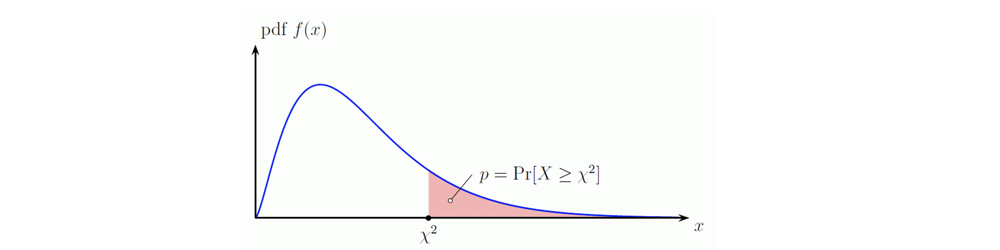

https://www.di-mgt.com.au/chisquare-calculator.html

#### Binomial test

<font size=3>Some quantities take one of two discrete values, and follow a binomial distribution when summed. In this case tou might use a [binomial test](https://www.real-statistics.com/binomial-and-related-distributions/hypothesis-testing-binomial-distribution/).

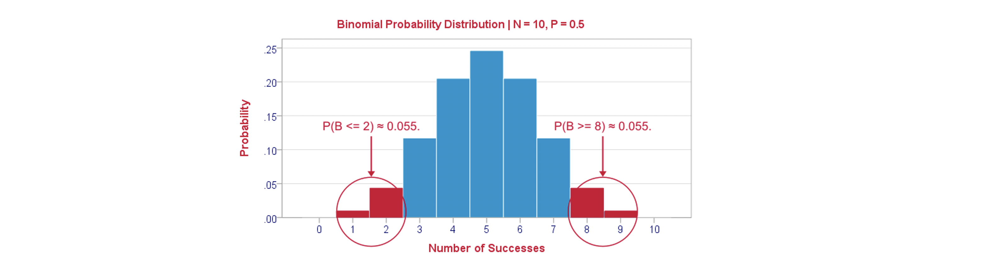

https://www.spss-tutorials.com/binomial-test/

<font size=5><center>T, $\chi^2$, binomial, and any other confidence test that uses a known analytical distribution __assumes that the statistic you care about follows that distribution__. These are called "parameteric" tests because they use assumed distribution parameters.

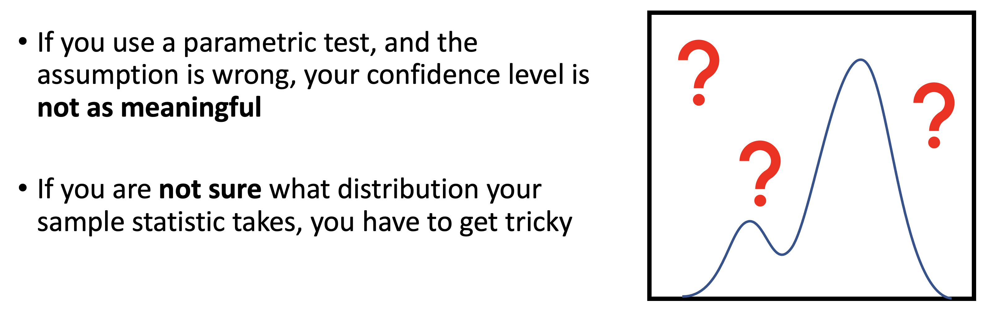

### B. _Exercise_: Distributions of the range



<font size=4>For the Photovoltaic materials, we often care about the LUMO - HOMO energy gap. Specifically, we want it to be as low as possible. For this reason we may be intersted in estimating __the 10th perecentile LUMO - HOMO gap__ in the datawith some confidence.
    
<font size=4>1. Sample data from HCEPDB many times in order to plot a distribution of sample 25th percentiles.
    
<font size=4>2. Does the resulting distribution resemble the Gaussian or T distribution? Should we use a t-test to estimate a confidence interval of the minimum?

> <span style='color:red'>remove before lecture

In [14]:
data = df['e_lumo_alpha'] - df['e_homo_alpha']

In [15]:
qs = []
for i in range(1000):
    s = data.sample(1000)
    qs.append(s.quantile(.1))

<AxesSubplot: ylabel='Count'>

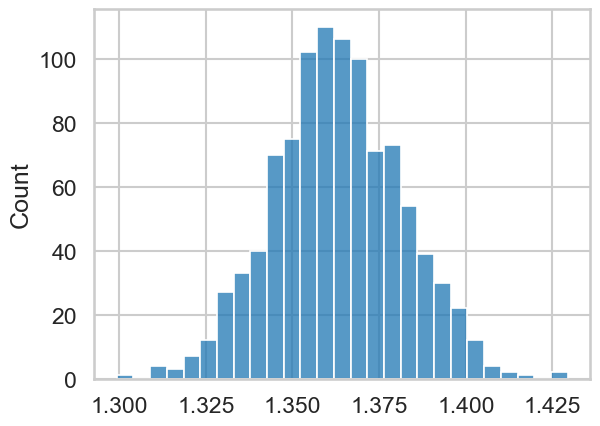

In [16]:
sns.histplot(qs)

<font size=4>The 10th percentile is somewhat normal, but a little off. A t-test would be at least minorly flawed. Instead, __we can use this distribution of sampled statistics directly to estimate a confidence of this statistic__

<font size=4>Let's say we are creating new solar materials using the same method that HCEPDB did for exploration. __It is important that at least 1 in 10 candidates have LUMO - HOMO less than 1.35 to be profitable__. Should we continue?

In [17]:
distr = scipy.stats.rv_histogram(np.histogram(qs))

In [18]:
print(f"The probability that the true 10th percential is less than 1.35 is {distr.cdf(1.35)}")

The probability that the true 10th percential is less than 1.35 is 0.2391065891602189


<font size=4>Unfortunately, we can only be 22% sure that our venture will be profitable.

<font size=5><center>__This is called bootstrapping, and we can do it with any (!!!) statistic.__

<font size=4>Scipy has bootstrapping builtin, unfortunately it is only two sided:

In [19]:
import time

In [20]:
def statistic_of_interest(data, axis):
    return np.quantile(data, .1, axis=axis)

<font size=4><span style="color:red">__Don't run this!!!__

In [ ]:
t0 = time.time()
print('Interval: ', scipy.stats.bootstrap((data,),statistic_of_interest, n_resamples=1000, batch=5))
print(f"Took {(time.time() - t0)/60} minutes.")

<font size=4><center>Why does it take so much longer than our manual method above???

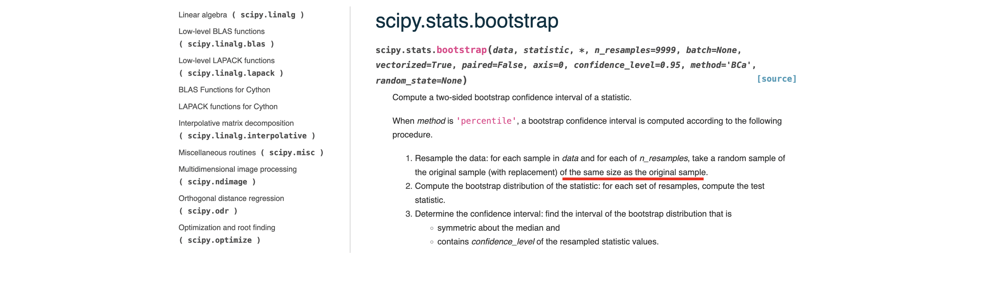

<font size=4>This method is non-parametric in that __we made no assumptions about the statistic distribution__

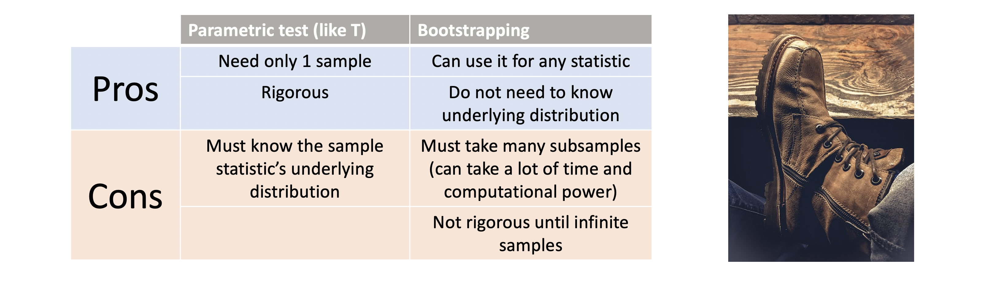

## 3. Distribution Divergence

<font size=5><center>Will a t-test on the sample means indicate to us the difference in these distributions?

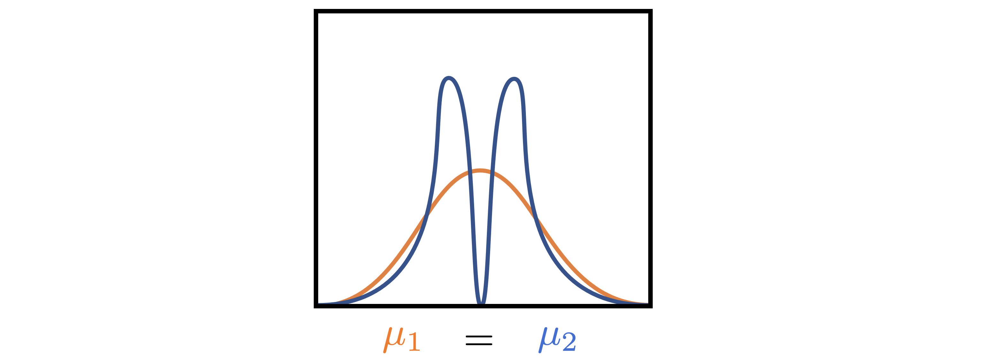

<font size=5><center>__Distribution divergence metrics__ like Jensen-Shannon divergence __measure the difference between an entire PDF__ as opposed to comparing averages which would not catch the above.

<font size=4>The distribution of sample [Jensen-Shannon divergence](https://en.wikipedia.org/wiki/Jensen%E2%80%93Shannon_divergence) (equation out of scope, just know that it compares two __continuous__ distribution curves) is not know, but luckily we can bootsrap anything!

In [ ]:
def metric_of_interest(data_sample_1, data_sample_2, axis=None):
    # get the min and max values to compute PDF
    global_minimum = min([data_sample_1.min(), data_sample_2.min()])
    global_maximum = min([data_sample_1.max(), data_sample_2.max()])
    width = global_maximum - global_minimum
    
    x = np.linspace(global_minimum - 0.1*width, global_maximum + 0.1*width, 1000)
    
    # create empirical PDFs for the samples
    s1_distro = scipy.stats.rv_histogram(np.histogram(data_sample_1))
    s2_distro = scipy.stats.rv_histogram(np.histogram(data_sample_2))
    
    # compute JSD
    JSD = scipy.spatial.distance.jensenshannon(s1_distro.pdf(x), s2_distro.pdf(x))
    return [JSD,]

In [ ]:
print('Interval: ', scipy.stats.bootstrap(
    (small_mass_sample, random_sample),
    metric_of_interest,
    n_resamples=1000,
    batch=5,
    method='percentile'
))

<font size=4>We are very confident that the divergence is about 0.55, JSD will be 0.0 for identical distributions and 1.0 for completely different distributions, given that out confidence interval does not come close to 0.0 we are confident (95%) That these distributions are different.

## Summary

<font size=4> -We discussed __confidence intervals__, and used __t tests__ to compute them for sample means given that we know means follow the T distribution
    
<font size=4> -Using the same mechanics and confidence intervals, we can __test one sided or two-sided hypothesis like "is the mean close to a particular value?"__
    
<font size=4> -We can use hypothesis tests to __test samples against eachother, did they come from the same place__?
    
<font size=4> -We tried out __bootstrapping__, which allows us to do all of the above without having to know the underlying distribution/parameters __for any sample statistic we care about__, however we need to take many sub samples.
    
<font size=4> -We looked at a __divergence statistic__ which compared full PDFs, and we bootstrapped it to confirm that two distributions were different with confidence.